## xG-model trained and tested on womens data

In [2]:
import pandas as pd
import numpy as np
from sklearn import metrics
herrallsvenskan = pd.read_csv('csv/allsvenskan_all.csv')
player_positions = pd.read_csv('csv/player_positions.csv', dtype={'Player Name': str, 'Mean X-Position': np.float64, 'Mean Y-Position': np.float64, 'Event Amount': np.int64, 'Position': str, 'Role': str})


In [3]:
player_positions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1646 entries, 0 to 1645
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Player Name      1646 non-null   object 
 1   Mean X-Position  1646 non-null   float64
 2   Mean Y-Position  1646 non-null   float64
 3   Event Amount     1646 non-null   int64  
 4   Position         1260 non-null   object 
 5   Role             1260 non-null   object 
dtypes: float64(2), int64(1), object(3)
memory usage: 77.3+ KB


## Creating the features for the dataset

In [4]:
import math
data = []

width = 7.32

herrallsvenskan = herrallsvenskan[herrallsvenskan['penalty'] == False] 

def calculate_angle(x, y):
    scaled_x = x * 1.2
    scaled_y = y * 0.8

    g0 = [120, 44]
    p = [scaled_x, scaled_y]
    g1 = [120, 36]

    v0 = np.array(g0) - np.array(p)
    v1 = np.array(g1) - np.array(p)

    angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
    return(abs(np.degrees(angle)))

def calculate_dist (x ,y):
    scaled_x = (x * 1.2) - 120
    scaled_y = (y * 0.8) - 40
    dist = np.sqrt(np.power(scaled_x,2) + np.power(scaled_y,2))
    return dist


def shot_in_box (x , y):
    scaled_x = x * 1.2
    scaled_y = y * 0.8
    if ((103.5 < scaled_x ) and (19.9 < scaled_y ) and (scaled_y < 59.9)):
        return True
    else:
        return False

def pass_length (x1, y1 , x2, y2):
    scaled_x1 = x1 *1.2
    scaled_x2 = x2 * 1.2
    scaled_y1 = y1 * 0.8
    scaled_y2 = y2 * 0.8
    pl = np.sqrt((scaled_x1 - scaled_x2)**2 + (scaled_y1 - scaled_y2)**2)
    return pl



for i in range(len(herrallsvenskan) - 1):
    if herrallsvenskan.iloc[i]['action'] == 'Shot' and herrallsvenskan.iloc[i+1]['action'] != 'Goal':
        player = herrallsvenskan.iloc[i]['player']
        playerdf = player_positions[player_positions['Player Name'] == player]
        position = playerdf['Role'].values
        #if position.size == 0:
        #    position = 'other'
        #print(position[0])

        if herrallsvenskan.iloc[i-1]['action'] == 'Pass accurate':
            data.append({'goal': 0, 
                         'header': herrallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']), 
                         'distance': calculate_dist(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']), 
                         'attack-type': herrallsvenskan.iloc[i]['attack_type'], 
                         'shot-in-box': shot_in_box(herrallsvenskan.iloc[i]['xpos'],herrallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
        else:
            data.append({'goal': 0, 
                         'header': herrallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']),
                         'distance': calculate_dist(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']),
                         'attack-type': herrallsvenskan.iloc[i]['attack_type'],
                         'shot-in-box': shot_in_box(herrallsvenskan.iloc[i]['xpos'],herrallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
    
    elif herrallsvenskan.iloc[i]['action'] == 'Shot' and herrallsvenskan.iloc[i+1]['action'] == 'Goal':
        player = herrallsvenskan.iloc[i]['player']
        playerdf = player_positions[player_positions['Player Name'] == player]
        position = playerdf['Role'].values
        #if position.size == 0:
        #    position = 'other'
        #print(position[0])
        if herrallsvenskan.iloc[i-1]['action'] == 'Pass accurate':   
            data.append({'goal': 1,
                         'header': herrallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']), 
                         'distance': calculate_dist(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']), 
                         'attack-type': herrallsvenskan.iloc[i]['attack_type'], 
                         'shot-in-box': shot_in_box(herrallsvenskan.iloc[i]['xpos'],herrallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
        else:
            data.append({'goal': 1,
                         'header': herrallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']), 
                         'distance': calculate_dist(herrallsvenskan.iloc[i]['xpos'], herrallsvenskan.iloc[i]['ypos']), 
                         'attack-type': herrallsvenskan.iloc[i]['attack_type'], 
                         'shot-in-box': shot_in_box(herrallsvenskan.iloc[i]['xpos'],herrallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
data = pd.DataFrame(data)
# Separating the features and the target variable 


X = data[['distance','angle', 'header', 'shot-in-box', 'attack-type','player-position']]

Y = data[['goal']]
data.info()



/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_17446/31869486.py:19: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30070 entries, 0 to 30069
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   goal             30070 non-null  int64  
 1   header           30070 non-null  bool   
 2   angle            30070 non-null  float64
 3   distance         30070 non-null  float64
 4   attack-type      11617 non-null  object 
 5   shot-in-box      30070 non-null  bool   
 6   player-position  29646 non-null  object 
dtypes: bool(2), float64(2), int64(1), object(2)
memory usage: 1.2+ MB


In [5]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30070 entries, 0 to 30069
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   distance         30070 non-null  float64
 1   angle            30070 non-null  float64
 2   header           30070 non-null  bool   
 3   shot-in-box      30070 non-null  bool   
 4   attack-type      11617 non-null  object 
 5   player-position  29646 non-null  object 
dtypes: bool(2), float64(2), object(2)
memory usage: 998.5+ KB


## Categorical gradient boosting 

In [6]:
import catboost as cb
from catboost import Pool, CatBoostRegressor
import catboost as cb
import ipywidgets
xg_cat_boost = np.zeros((100,80))

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, brier_score_loss
from sklearn.metrics import classification_report

attack_type_mean = data.groupby('attack-type')['goal'].mean()

X['attack-type'] = data['attack-type'].map(attack_type_mean)

player_positions_mean = data.groupby('player-position')['goal'].mean()

# Step 2: Map the mean values to the corresponding categories
X['player-position'] = data['player-position'].map(player_positions_mean)





X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.2, random_state=42, shuffle=True)

train_pool = Pool(X_train, 
                  y_train)

test_pool = Pool(X_test,y_test)

model = cb.CatBoostRegressor(loss_function='RMSE')


grid = {'iterations': [100, 150, 200, 250, 300],
        'learning_rate': [0.03, 0.1, 0.01, 0.15],
        'depth': [2, 4, 6, 8, 10],
        'l2_leaf_reg': [0.2, 0.5, 1, 3, 5]}


result = model.grid_search(grid, train_pool, plot=True)

feature_importance = model.get_feature_importance()


pred = model.predict(X_test)

print(result['params'])


/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_17446/954006577.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['attack-type'] = data['attack-type'].map(attack_type_mean)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_17446/954006577.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['player-position'] = data['player-position'].map(player_positions_mean)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.3103046	test: 0.2949770	best: 0.2949770 (0)	total: 57ms	remaining: 5.64s
1:	learn: 0.3087209	test: 0.2935559	best: 0.2935559 (1)	total: 59.2ms	remaining: 2.9s
2:	learn: 0.3071739	test: 0.2921971	best: 0.2921971 (2)	total: 60.8ms	remaining: 1.97s
3:	learn: 0.3057466	test: 0.2909231	best: 0.2909231 (3)	total: 62.4ms	remaining: 1.5s
4:	learn: 0.3044167	test: 0.2897833	best: 0.2897833 (4)	total: 64.4ms	remaining: 1.22s
5:	learn: 0.3031321	test: 0.2886245	best: 0.2886245 (5)	total: 66.5ms	remaining: 1.04s
6:	learn: 0.3019595	test: 0.2875443	best: 0.2875443 (6)	total: 68ms	remaining: 904ms
7:	learn: 0.3007673	test: 0.2864983	best: 0.2864983 (7)	total: 68.8ms	remaining: 792ms
8:	learn: 0.2996565	test: 0.2854678	best: 0.2854678 (8)	total: 69.4ms	remaining: 702ms
9:	learn: 0.2986069	test: 0.2845233	best: 0.2845233 (9)	total: 70.1ms	remaining: 631ms
10:	learn: 0.2975467	test: 0.2836532	best: 0.2836532 (10)	total: 70.7ms	remaining: 572ms
11:	learn: 0.2966078	test: 0.2828364	best: 0.28

## Calculating the brier score of the model

In [7]:
print("Mean: ", pred.mean())
print("Min :",pred.min())
print("Max :",pred.max())


rmse = (np.sqrt(mean_squared_error(y_test, pred)))
mae = (mean_absolute_error(y_test, pred))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.4f}'.format(rmse))
print('R2: {:.4f}'.format(r2))
print('MAE: {:.4f}'.format(mae))

for i in range(len(pred)):
    if pred[i] > 1:
        pred[i] = 1
    if pred[i] < 0:
        pred[i] = 0

brier_score = brier_score_loss(y_test, pred)
print('Brier score: {:.4f}'.format(brier_score))


for i , feature_name in enumerate(X_train.columns):
    print(f'Feature {feature_name}, importance: {feature_importance[i]}')

fpr, tpr, thresholds = metrics.roc_curve(y_test, pred, pos_label=1)
print("AUC: ", metrics.auc(fpr, tpr))

Mean:  0.0953603158450216
Min : -0.029301680286584378
Max : 0.929327239324934
Testing performance
RMSE: 0.2879
R2: 0.1196
MAE: 0.1574
Brier score: 0.0829
Feature distance, importance: 30.403252490910127
Feature angle, importance: 27.876755586936714
Feature header, importance: 17.264956401009215
Feature shot-in-box, importance: 2.84091251816777
Feature attack-type, importance: 12.399500831094834
Feature player-position, importance: 9.21462217188134
AUC:  0.7658788910604364


## SHAP

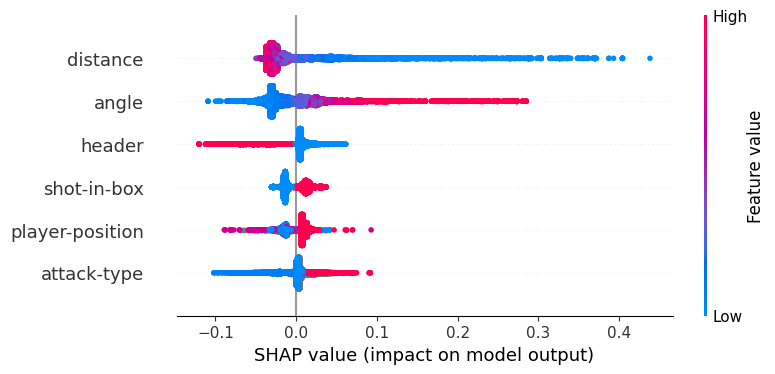

In [8]:
import shap

shap.initjs()
explainer = shap.TreeExplainer(model)
shap_values = explainer(X)
shap.plots.beeswarm(shap_values)

In [14]:
shap.decision_plot(explainer.expected_value[1], shap_values[1], X_test.columns)

IndexError: invalid index to scalar variable.